# Problem Statement
Using 3 different types of models, we want to be able to classify drivers who are distracted on the road.

## Executive Summary
Statefarm, an insurance company, wants to be able to revise their premiums for car insurance as accurately as possible and thus wants to identify the states of the driver when driving. For example differentiating whether they are: on the phone,eating or just simply driving safely. The dataset they have collected are separated into the groupings on the file with a main file that serves like a directory for the images. We wish to achieve a model with Kaggle Score (ie. multiclass-loss) of about 2 which is about the average loss expected from the sample set while trying to minimize the runtime. We end up selecting the below cnn model as the optimum choice mostly due to accuracy choices

In [1]:
from skimage import io as skio
import pandas as pd
import matplotlib.pyplot as plt
from skimage import filters,morphology
import glob, os
import cv2
import numpy as np
from scipy.ndimage import label
from keras.layers import Input,Dense,Flatten,Dropout,Conv2D,MaxPooling2D,BatchNormalization
from keras.models import Sequential,load_model
from keras.callbacks import EarlyStopping
from keras.preprocessing.image import load_img,img_to_array,ImageDataGenerator
from keras.utils import to_categorical
%matplotlib inline

Using TensorFlow backend.


In [2]:
image_list=pd.read_csv('driver_imgs_list.csv')
image_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22424 entries, 0 to 22423
Data columns (total 3 columns):
subject      22424 non-null object
classname    22424 non-null object
img          22424 non-null object
dtypes: object(3)
memory usage: 525.7+ KB


In [3]:
image_list.classname.value_counts()
# 10 classes noticed

c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: classname, dtype: int64

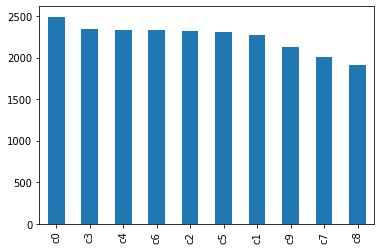

In [4]:
image_list.classname.value_counts().plot(kind='bar')
# somewhat even classes?

In [5]:
img = skio.imread('imgs/test/test/img_1.jpg',as_gray=True)

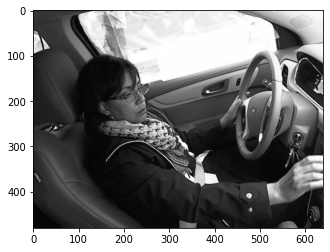

In [6]:
plt.imshow(img,cmap='gray')

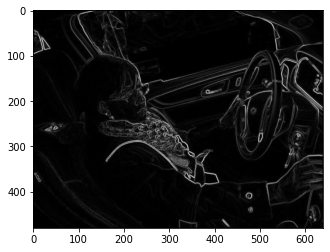

In [7]:
sobel = filters.sobel(img)
plt.imshow(sobel,cmap='gray')

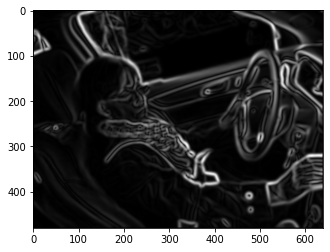

In [8]:
blurred = filters.gaussian(img, sigma=3.0)
sobel = filters.sobel(blurred)
plt.imshow(sobel,cmap='gray')

## Attempt to make a non-key feature elimation method ( I want keep hand, eyes,face)

(2, 163511)


661

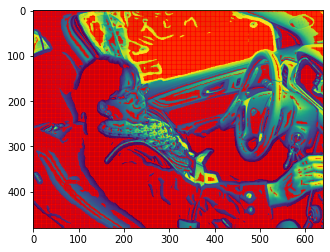

In [9]:
# finding which pixel is dark
dark_spots = np.array((sobel < 2/255).nonzero())
print(dark_spots.shape)
# plotting wherethe dark spots are
plt.scatter(dark_spots.T[:, 1], dark_spots.T[:, 0], color='red', marker='o', s=0.01)
plt.imshow(img)
# making a all dark image
bool_mask = np.zeros(sobel.shape, dtype=np.bool)
# dark_spots are set as 1
bool_mask[tuple(dark_spots)] = 1

seed_mask, num_seeds = label(bool_mask)
num_seeds # number of pixels that are black, i mark 0 

red dots never cover face/hands.. managed to disregard many background features

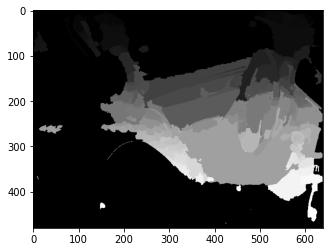

In [10]:
ws = morphology.watershed(img, seed_mask)
plt.imshow(ws,cmap='gray')

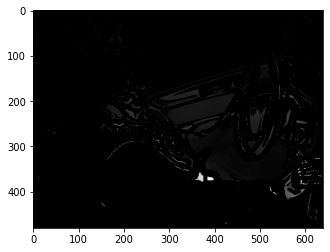

In [11]:
plt.imshow(seed_mask * img,cmap='gray')

(480, 640)


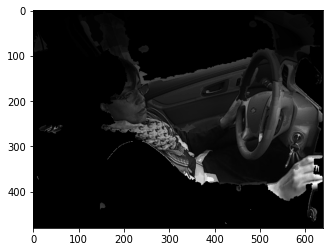

In [12]:
plt.imshow(ws * img,cmap='gray')
print(ws.shape)
# watershed makes the image smoother

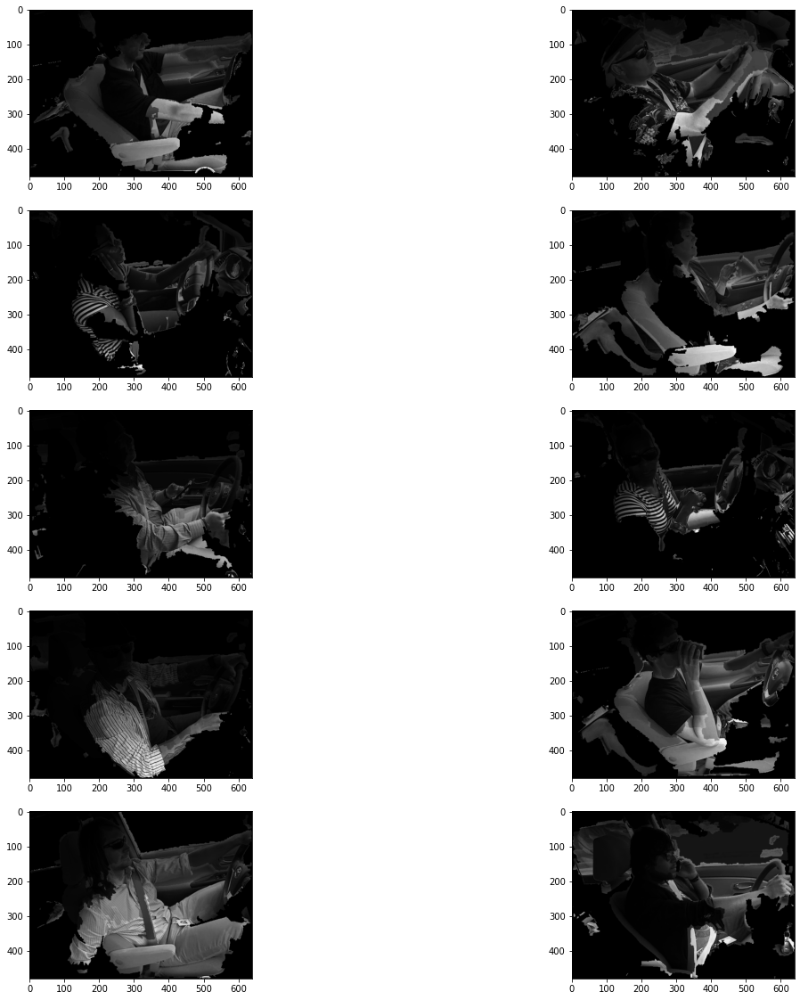

In [13]:
# try this preprocessing for 10 images
i=0
fig,ax=plt.subplots(5,2,figsize=(20,20))
ax=ax.ravel()
for images in glob.glob('imgs\\test\\test\\*.jpg'):
    img = skio.imread(images,as_gray=True)
    blurred = filters.gaussian(img, sigma=3.0)
    sobel = filters.sobel(blurred)
    dark_spots = np.array((sobel < 2/255).nonzero())
    bool_mask = np.zeros(sobel.shape, dtype=np.bool)
    bool_mask[tuple(dark_spots)] = 1
    seed_mask, num_seeds = label(bool_mask)
    ws = morphology.watershed(img, seed_mask)
    ax[i-1].imshow(img*ws,cmap='gray')
    i+=1
    if i>10:
        break

Looks like a good way to determine hand and face position... unless u black/wearing black then... I am going to push ahead cause i already spent a lot of time here

In [14]:
# skio read maxscales automatically..but keras preprocessing accepts functions that takes in the array
# keras also got a shape limitation so we need to adjust the shape accordingly
def image_transform(images):
    for channel in range(0,2):
        img = filters.gaussian(images[:,:,channel], sigma=3.0)
        img = filters.sobel(img)
        dark_spots = np.array((img > 2/255).nonzero())
        bool_mask = np.zeros(img.shape, dtype=np.bool)
        bool_mask[tuple(dark_spots)] = 1.
        seed_mask, num_seeds = label(bool_mask)
        ws = morphology.watershed(img, seed_mask)
        # do the watershed on all 3 layers
        images[:,:,channel]=ws*images[:,:,channel]
    return images

In [15]:
img = plt.imread('imgs/test/test/img_1.jpg')
img = img/255.

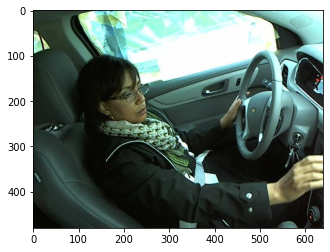

In [16]:
plt.imshow(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


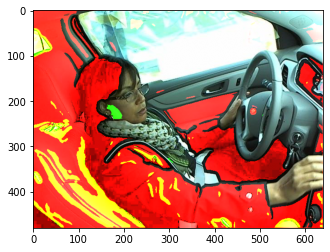

In [17]:
plt.imshow(image_transform(img))
# the red/yellow/green part will indicate which pixel in the channel is 0

## Kaggle Submission

In [18]:
# making a cnn model using this as input
def read_process_keras(directory):
    # minmax scaler
    train_datagen = ImageDataGenerator(rescale=1./255,validation_split=0.2,preprocessing_function=image_transform) # validation split of 0.2
    train_generator = train_datagen.flow_from_directory(
        directory,
        batch_size=64,
        interpolation='bicubic',
        subset='training') # to tell them this is a training set
    validation_generator = train_datagen.flow_from_directory(
        directory, # same directory as training data
        batch_size=64,
        interpolation='bicubic',
        subset='validation') # to tell them its a validation set
    
    return train_generator,validation_generator

In [19]:
X_train,X_test=read_process_keras('imgs\\train')

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.


In [20]:
model=Sequential()
model.add(Conv2D(64, kernel_size=3, activation='relu',input_shape=(256,256,3)))
model.add(MaxPooling2D((3,3)))
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(MaxPooling2D((3,3)))
model.add(BatchNormalization())
model.add(Conv2D(64, kernel_size=3, activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(BatchNormalization())
model.add(Conv2D(32, kernel_size=3, activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Flatten())
model.add(Dense(10, activation='softmax'))

In [ ]:
model.summary()

In [21]:
early_stopping_monitor = EarlyStopping(monitor='val_loss',min_delta=0,patience=2)
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [22]:
history=model.fit_generator(X_train,
                    validation_data = X_test, 
                    callbacks = [early_stopping_monitor],
                    epochs=10)

Epoch 1/10
281/281 [==============================] - 2426s 9s/step - loss: 0.6773 - categorical_accuracy: 0.8022 - val_loss: 1.1614 - val_categorical_accuracy: 0.2368
Epoch 2/10
281/281 [==============================] - 2568s 9s/step - loss: 0.0947 - categorical_accuracy: 0.9791 - val_loss: 0.0246 - val_categorical_accuracy: 0.9114
Epoch 3/10
281/281 [==============================] - 2469s 9s/step - loss: 0.0428 - categorical_accuracy: 0.9907 - val_loss: 0.1226 - val_categorical_accuracy: 0.9714
Epoch 4/10
281/281 [==============================] - 2673s 10s/step - loss: 0.0173 - categorical_accuracy: 0.9968 - val_loss: 1.8345e-04 - val_categorical_accuracy: 0.9848
Epoch 5/10
281/281 [==============================] - 2214s 8s/step - loss: 0.0105 - categorical_accuracy: 0.9979 - val_loss: 1.1325e-05 - val_categorical_accuracy: 0.9891
Epoch 6/10
281/281 [==============================] - 2586s 9s/step - loss: 0.0063 - categorical_accuracy: 0.9991 - val_loss: 0.1169 - val_categorical_

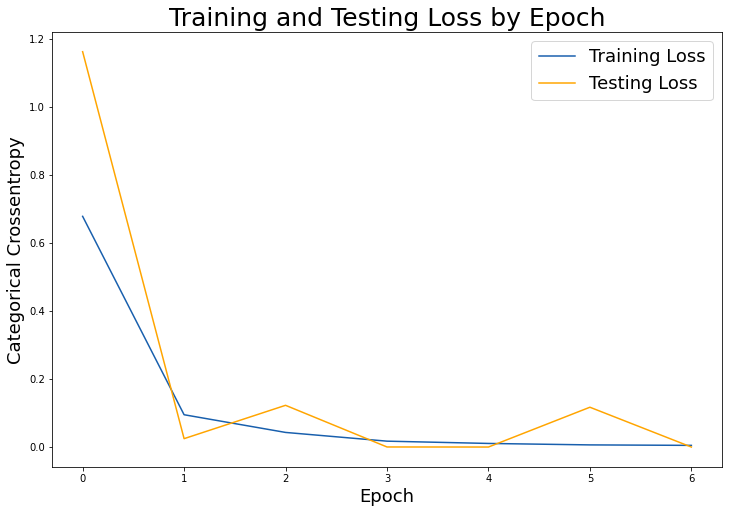

In [23]:
# Check out our train loss and test loss over epochs.
train_loss = history.history['loss']
test_loss = history.history['val_loss']

# Set figure size.
plt.figure(figsize=(12, 8))

# Generate line plot of training, testing loss over epochs.
plt.plot(train_loss, label='Training Loss', color='#185fad')
plt.plot(test_loss, label='Testing Loss', color='orange')

# Set title
plt.title('Training and Testing Loss by Epoch', fontsize = 25)
plt.xlabel('Epoch', fontsize = 18)
plt.ylabel('Categorical Crossentropy', fontsize = 18)

plt.legend(fontsize = 18);

In [24]:
# keeping the weight for future use
model.save('model/bg_removal.h5')
model.save_weights('model/bg_removal_weights.h5')

## Kaggle Submission

In [25]:
datagen = ImageDataGenerator(rescale=1./255,preprocessing_function=image_transform)
generator = datagen.flow_from_directory('imgs/test', # the test images is one subdirectory below test
                                        target_size=(256, 256),
                                        interpolation='bicubic',
                                        batch_size=64,
                                        class_mode=None,  # only data, no labels
                                        shuffle=False)  # keep data in same order as labels

Found 79726 images belonging to 1 classes.


In [26]:
kaggle = model.predict_generator(generator)
kaggle_submission=pd.DataFrame(kaggle)
kaggle_submission.head()

,0,1,2,3,4,5,6,7,8,9
0,0.000109,8.491648e-08,9.265239e-05,2.991020e-08,0.000024,9.968897e-01,6.561305e-06,0.001699,0.000023,0.001156
1,0.017386,8.143606e-06,5.416675e-02,4.468434e-03,0.000186,8.537656e-01,5.936602e-02,0.001389,0.005382,0.003881
2,0.908005,8.410353e-02,1.077901e-05,3.070650e-04,0.000003,8.261079e-08,1.778050e-03,0.000068,0.000026,0.005699
3,0.066536,2.808300e-02,2.374924e-01,1.594733e-05,0.000271,2.919027e-08,2.432393e-01,0.000316,0.423419,0.000627
4,0.000638,1.083218e-06,2.864609e-07,5.681802e-01,0.018502,3.300804e-04,9.135382e-07,0.000608,0.411194,0.000545


In [27]:
img_array=[]
for image in glob.glob(f"imgs\\test\\test\\*.jpg"):
    img=image.split('\\')[-1]
    img_array.append(img)

In [28]:
kaggle_submission.index=img_array
kaggle_submission.columns=['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
kaggle_submission.index.name='img'
kaggle_submission.to_csv('kaggle_bg_removal.csv')

result with preprocessing function
![](assets/bg_removal.JPG)

result without preprocessing function
![](assets/cnn_without_preoprocessing.bmp)

In [29]:
def kaggle_submission(name):
    datagen = ImageDataGenerator(rescale=1./255,preprocessing_function=image_transform)
    generator = datagen.flow_from_directory('imgs/test', # the test images is one subdirectory below test
                                        target_size=(256, 256),
                                        interpolation='bicubic',
                                        batch_size=64,
                                        class_mode=None,  # only data, no labels
                                        shuffle=False)  # keep data in same order as labels
    kaggle = model.predict_generator(generator)
    kaggle_submission=pd.DataFrame(kaggle)
    img_array=[]
    for image in glob.glob(f"imgs\\test\\test\\*.jpg"):
        img=image.split('\\')[-1]
        img_array.append(img)
    kaggle_submission.index=img_array
    kaggle_submission.columns=['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']
    kaggle_submission.index.name='img'
    kaggle_submission.to_csv(name)

## To see the failed predictions

In [30]:
model = load_model('model/bg_removal.h5')
model.load_weights('model/bg_removal_weights.h5')

In [31]:
datagen = ImageDataGenerator(rescale=1./255,preprocessing_function=image_transform)
generator = datagen.flow_from_directory('imgs/train', # the test images is one subdirectory below test
                                        target_size=(256, 256),
                                        interpolation='bicubic',
                                        batch_size=64,
                                        class_mode=None,  # only data, no labels
                                        shuffle=False)  # keep data in same order as labels

Found 22424 images belonging to 10 classes.


In [32]:
search_for_fails = model.predict_generator(generator)

In [33]:
preds=[i.argmax() for i in search_for_fails]

In [34]:
predictions=pd.DataFrame(data=[preds,generator.filenames]).T
predictions.index=[i.split('\\')[-1] for i in generator.filenames]
predictions.columns=['preds','location']

In [35]:
actual=pd.read_csv('driver_imgs_list.csv',index_col='img')

In [36]:
y=actual.sort_values(['classname','img'])['classname'].str.replace('c','').astype('int')
y

img
img_100026.jpg    0
img_10003.jpg     0
img_100050.jpg    0
img_100074.jpg    0
img_10012.jpg     0
                 ..
img_99761.jpg     9
img_99801.jpg     9
img_99927.jpg     9
img_9993.jpg      9
img_99949.jpg     9
Name: classname, Length: 22424, dtype: int32

In [37]:
model_result=predictions.merge(y,on=predictions.index)

In [38]:
wrong_pred=model_result[model_result.preds!=model_result.classname]

In [39]:
wrong_pred.reset_index(inplace=True,drop=True)

In [40]:
wrong_pred

,key_0,preds,location,classname
0,img_15073.jpg,5,c0\img_15073.jpg,0
1,img_18003.jpg,5,c1\img_18003.jpg,1
2,img_18370.jpg,3,c2\img_18370.jpg,2
3,img_19357.jpg,6,c2\img_19357.jpg,2
4,img_1565.jpg,0,c3\img_1565.jpg,3
5,img_19330.jpg,4,c3\img_19330.jpg,3
6,img_19992.jpg,0,c3\img_19992.jpg,3
7,img_22681.jpg,0,c4\img_22681.jpg,4
8,img_38427.jpg,1,c4\img_38427.jpg,4
9,img_12442.jpg,0,c5\img_12442.jpg,5


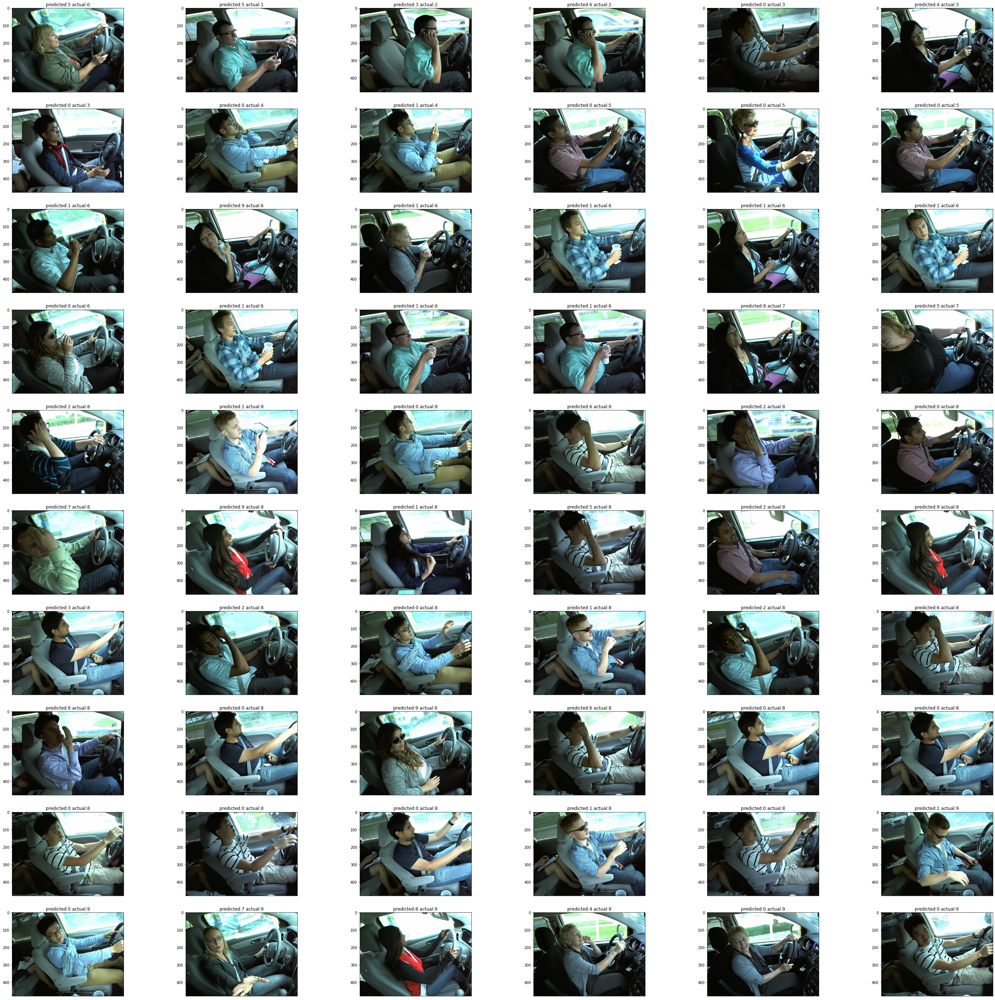

In [46]:
fig,ax=plt.subplots(10,ncols=6,figsize=(50,50))
ax=ax.ravel()
for i,j in enumerate(wrong_pred.location):
    for images in (glob.glob(f'imgs\\train\\{j}')):
        img=skio.imread(images)
        ax[i].set_title(f'predicted:{wrong_pred.preds[i]} actual:{wrong_pred.classname[i]}')
        ax[i].axes.get_xaxis().set_visible(False)
        ax[i].imshow(img)

In [ ]:
# no common indentity to say what the model is not good at...

## Evaluation plus conclusion

![](assets/metrics.png)

Overall, despite attempts to solve this using ensemble methods(in the other workbooks), the accuracy was not achieved. Mostly, due to the slight variations in the image position. Different preprocessing methods such as radon transformation or bounding box method might be able to give a better score instead of the simple background removal. How it does show that with a clever tweak in the proprocessing function we can actually reduce the amount of layers we need in cnn which helped optimizing traintime although it does not have much impacts on the prediction speed of the model. For statefarm usage, if not asking for live update of driving states, 6 layers of cnn would be optimal amongst the models proposed.

There are a few limitations to the data provided. Due to safety and ethical reasons, the images collected are from volunteers or paid individuals pretending to be driving around in a car while being tolled in a lorry. Therefore, the images are always in the day and in that 2 cars or so with only that one driver (it is quite funny to see some of the drivers having to talk to some imaginary friend in state 9: talking to passengers). This cannot be further from life application where people do drive in the night (lighting from within the car and lighting from outside the car produces very different images), have very different car interiors (model need to pick up filters that ignores these) and having other passengers (might provide obstructed images)

For future works, I am interested to see if i can combine the method used in this project. For instance, we could grayscale the image used in cnn which means it only takes 1 channel and use with other transformations of the image such as the background removal used for the other 2 channels. This could optimally reduce the amount of layers we use and improve proccessing time. We could alternative adopt the modules in the inception model and include it into our cnn.
